# 13. パターンと図形の抽出
SIFT特徴量を使いたいので，現時点で最新のOpenCV 4.5.2.54を入れる

In [1]:
!wget https://github.com/eiichiromomma/CVMLAB/raw/master/img/sample.jpg
!wget https://github.com/eiichiromomma/CVMLAB/raw/master/img/Calc_s.jpg
!wget https://github.com/eiichiromomma/CVMLAB/raw/master/img/Calc.jpg
!wget https://github.com/eiichiromomma/CVMLAB/raw/master/img/crane.jpg
!wget https://github.com/eiichiromomma/CVMLAB/raw/master/img/Calc2.jpg
!wget https://github.com/eiichiromomma/CVMLAB/raw/master/img/CalcO5_s.jpg
!pip install japanize-matplotlib
!pip install opencv-contrib-python==4.5.2.54


--2021-07-12 08:31:05--  https://github.com/eiichiromomma/CVMLAB/raw/master/img/sample.jpg
Resolving github.com (github.com)... 140.82.112.4
Connecting to github.com (github.com)|140.82.112.4|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/eiichiromomma/CVMLAB/master/img/sample.jpg [following]
--2021-07-12 08:31:05--  https://raw.githubusercontent.com/eiichiromomma/CVMLAB/master/img/sample.jpg
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.110.133, 185.199.111.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 78522 (77K) [image/jpeg]
Saving to: ‘sample.jpg’

sample.jpg          100%[===================>]  76.68K  --.-KB/s    in 0.007s  

2021-07-12 08:31:05 (10.4 MB/s) - ‘sample.jpg’ saved [78522/78522]

--2021-07-12 08:31:05--  https://github.com/eiichiromomma/C

# テンプレートマッチング
「5」だけの画像は別途アングルを変えて撮影したもの

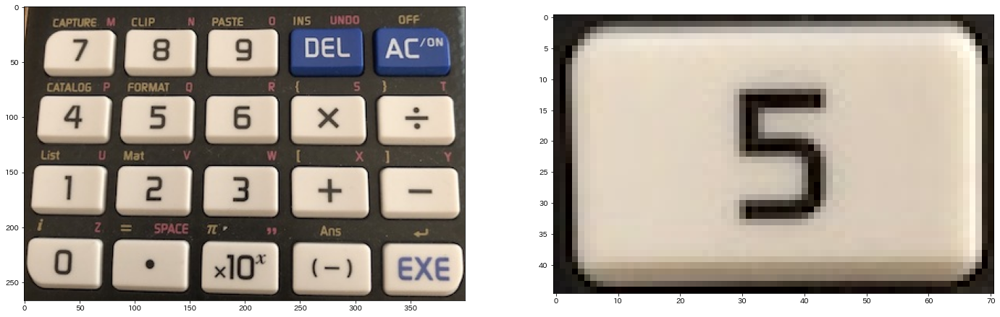

In [2]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from skimage.feature import greycomatrix, greycoprops # 0.18.xまでは"grey"
import japanize_matplotlib
from __future__ import print_function
from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets
plt.rc('figure', figsize=[24,12])
cimg = cv2.imread('Calc_s.jpg')
template = cv2.imread('CalcO5_s.jpg')
plt.subplot(1,2,1)
plt.imshow(cv2.cvtColor(cimg, cv2.COLOR_BGR2RGB))
plt.subplot(1,2,2)
plt.imshow(cv2.cvtColor(template, cv2.COLOR_BGR2RGB))

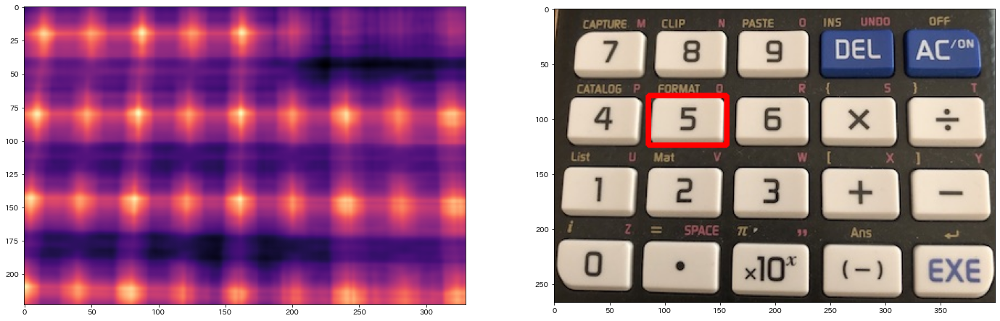

In [3]:
res = cv2.matchTemplate(cimg, template, cv2.TM_SQDIFF)
plt.subplot(1,2,1)
plt.imshow(1-res, cmap='magma')
dst = cimg.copy()
minval, maxval, minloc, maxloc = cv2.minMaxLoc(1-res)
p2 = (maxloc[0]+template.shape[1], maxloc[1]+template.shape[0])
cv2.rectangle(dst,  maxloc, p2 , (0,0,255), 3)
plt.subplot(1,2,2)
plt.imshow(cv2.cvtColor(dst, cv2.COLOR_BGR2RGB))

TM_SQDIFF_NORMED正規化二乗誤差

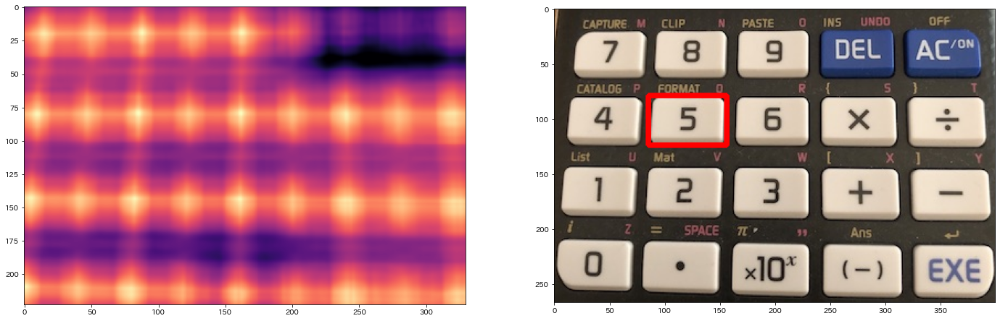

In [4]:
res = cv2.matchTemplate(cimg, template, cv2.TM_SQDIFF_NORMED)
plt.subplot(1,2,1)
plt.imshow(1-res, cmap='magma')
dst = cimg.copy()
minval, maxval, minloc, maxloc = cv2.minMaxLoc(1-res)
p2 = (maxloc[0]+template.shape[1], maxloc[1]+template.shape[0])
cv2.rectangle(dst,  maxloc, p2 , (0,0,255), 3)
plt.subplot(1,2,2)
plt.imshow(cv2.cvtColor(dst, cv2.COLOR_BGR2RGB))

NCC

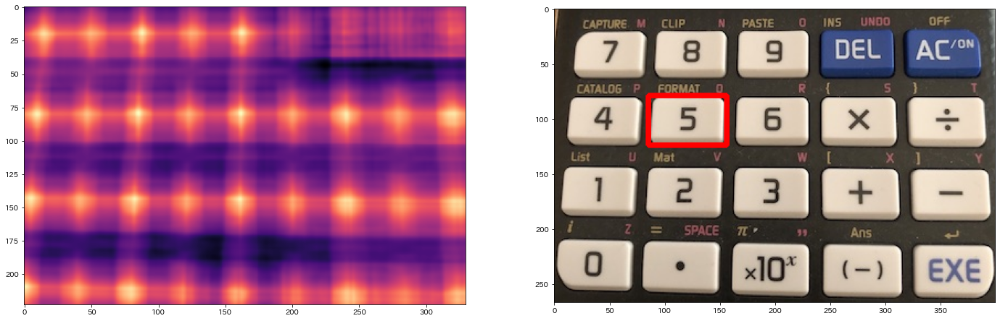

In [5]:
res = cv2.matchTemplate(cimg, template, cv2.TM_CCORR_NORMED)
plt.subplot(1,2,1)
plt.imshow(res, cmap='magma')
dst = cimg.copy()
minval, maxval, minloc, maxloc = cv2.minMaxLoc(res)
p2 = (maxloc[0]+template.shape[1], maxloc[1]+template.shape[0])
cv2.rectangle(dst,  maxloc, p2 , (0,0,255), 3)
plt.subplot(1,2,2)
plt.imshow(cv2.cvtColor(dst, cv2.COLOR_BGR2RGB))

ZNCC

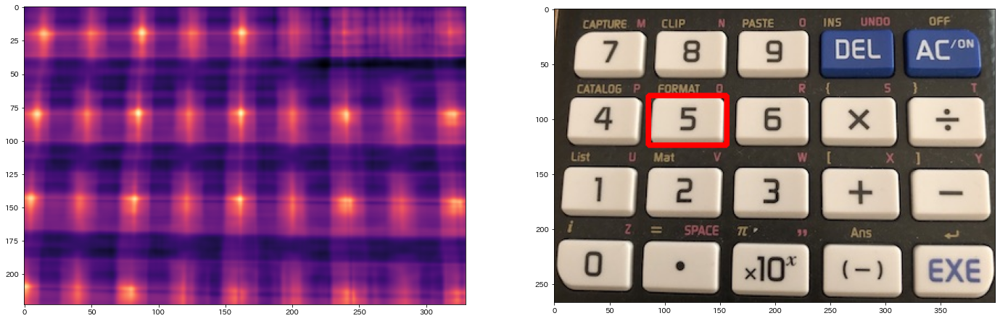

In [6]:
res = cv2.matchTemplate(cimg, template, cv2.TM_CCOEFF_NORMED)
plt.subplot(1,2,1)
plt.imshow(res, cmap='magma')
dst = cimg.copy()
minval, maxval, minloc, maxloc = cv2.minMaxLoc(res)
p2 = (maxloc[0]+template.shape[1], maxloc[1]+template.shape[0])
cv2.rectangle(dst,  maxloc, p2 , (0,0,255), 3)
plt.subplot(1,2,2)
plt.imshow(cv2.cvtColor(dst, cv2.COLOR_BGR2RGB))

# Image Pyramid
エイリアシングの影響を避けるためにガウシアン処理が入っている

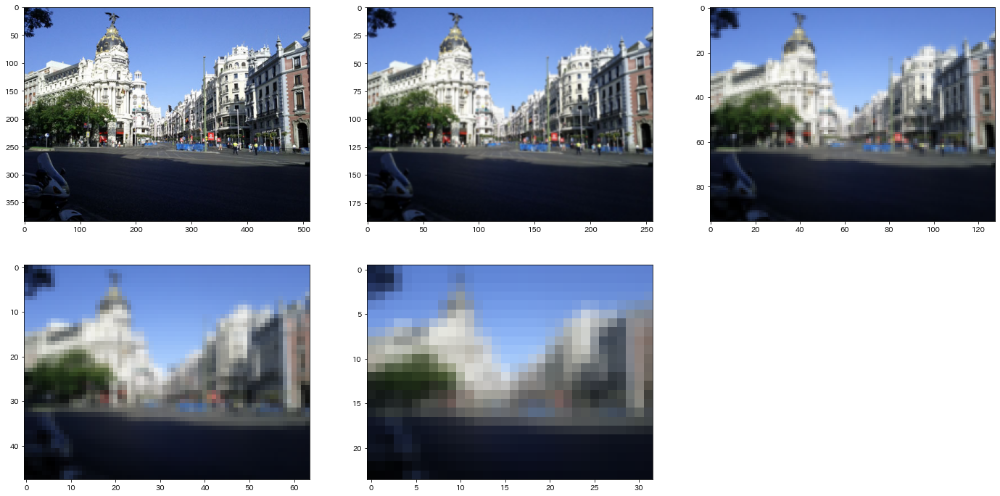

In [7]:
cimg = cv2.imread('sample.jpg')
img2 = cv2.pyrDown(cimg)
img3 = cv2.pyrDown(img2)
img4 = cv2.pyrDown(img3)
img5 = cv2.pyrDown(img4)
plt.subplot(2,3,1)
plt.imshow(cv2.cvtColor(cimg, cv2.COLOR_BGR2RGB))
plt.subplot(2,3,2)
plt.imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB))
plt.subplot(2,3,3)
plt.imshow(cv2.cvtColor(img3, cv2.COLOR_BGR2RGB))
plt.subplot(2,3,4)
plt.imshow(cv2.cvtColor(img4, cv2.COLOR_BGR2RGB))
plt.subplot(2,3,5)
plt.imshow(cv2.cvtColor(img5, cv2.COLOR_BGR2RGB))

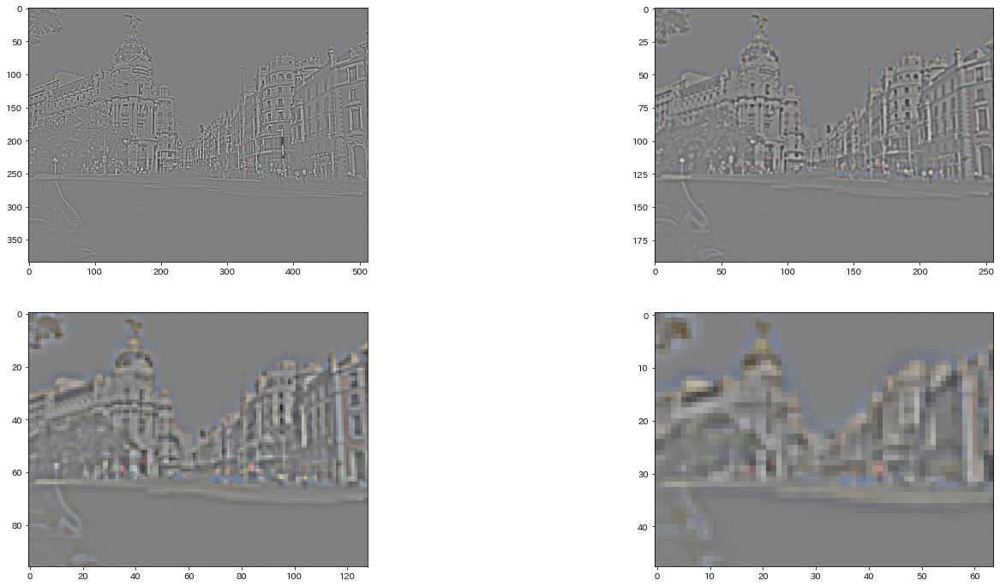

In [8]:
plt.subplot(2,2,1)
plt.imshow(cv2.cvtColor(cimg-cv2.pyrUp(img2)+128, cv2.COLOR_BGR2RGB))
plt.subplot(2,2,2)
plt.imshow(cv2.cvtColor(img2-cv2.pyrUp(img3)+128, cv2.COLOR_BGR2RGB))
plt.subplot(2,2,3)
plt.imshow(cv2.cvtColor(img3-cv2.pyrUp(img4)+128, cv2.COLOR_BGR2RGB))
plt.subplot(2,2,4)
plt.imshow(cv2.cvtColor(img4-cv2.pyrUp(img5)+128, cv2.COLOR_BGR2RGB))

# Harris Corner Detector ， Good Features to track, FAST
Notebookのmagic commandのtimeitで処理時間を比較しているが若干Harrisの方が速い(Harrisは閾値による選別が必要)

1 loop, best of 50: 9.62 ms per loop
1 loop, best of 50: 13.1 ms per loop
1 loop, best of 50: 851 µs per loop


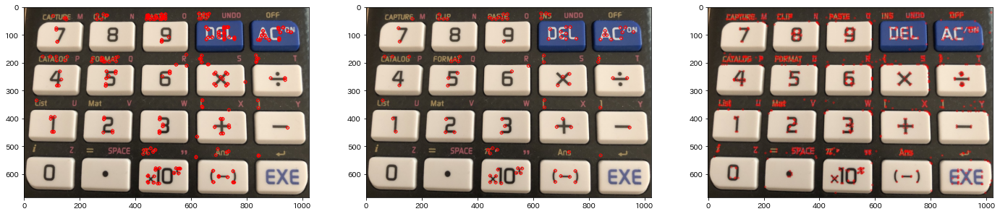

In [9]:
cimg = cv2.imread('Calc.jpg')
gimg = cv2.cvtColor(cimg, cv2.COLOR_BGR2GRAY)
hcorner = cv2.cornerHarris(gimg, 2, 3, 0.04)
threshold = 0.0005
for j in range(hcorner.shape[0]):
    for i in range(hcorner.shape[1]):
        if (hcorner[j, i] > threshold):
            cv2.circle(cimg, (i,j), 5, (0,0,255), 2)
plt.subplot(1,3,1)
plt.imshow(cv2.cvtColor(cimg, cv2.COLOR_BGR2RGB))
cimg = cv2.imread('Calc.jpg')
gimg = cv2.cvtColor(cimg, cv2.COLOR_BGR2GRAY)
corner = cv2.goodFeaturesToTrack(gimg, 100, 0.01, 10)
for c in corner:
  i, j = c.ravel().astype(np.int16)
  cv2.circle(cimg, (i,j), 5, (0,0,255), 2)
plt.subplot(1,3,2)
plt.imshow(cv2.cvtColor(cimg, cv2.COLOR_BGR2RGB))

cimg = cv2.imread('Calc.jpg')
gimg = cv2.cvtColor(cimg, cv2.COLOR_BGR2GRAY)
fast = cv2.FastFeatureDetector_create(30) #引数は閾値(default:10)
kp = fast.detect(gimg, None)
cv2.drawKeypoints(cimg, kp, cimg, color=(0, 0, 255))
plt.subplot(1,3,3)
plt.imshow(cv2.cvtColor(cimg, cv2.COLOR_BGR2RGB))

%timeit -n 1 -r 50 cv2.cornerHarris(gimg, 2, 3, 0.04)
%timeit -n 1 -r 50 cv2.goodFeaturesToTrack(gimg, 150, 0.01, 10)
%timeit -n 1 -r 50 fast.detect(gimg, None)


# SIFT, KAZE
特許切れでOpenCVでも標準的に使えるようになった。(新しいバージョンが必要)

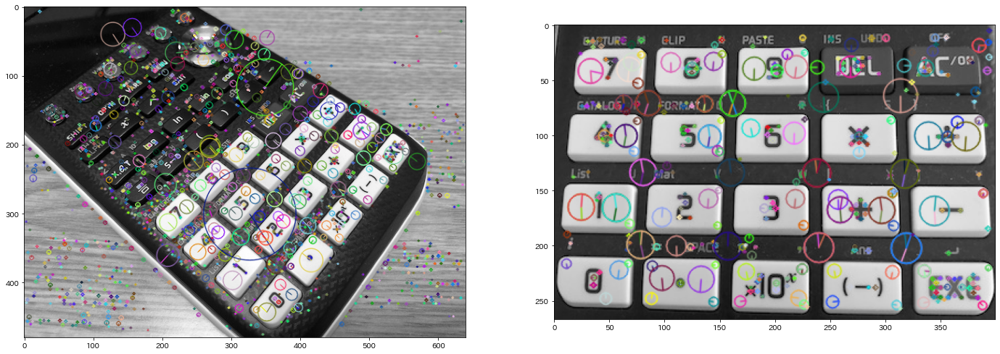

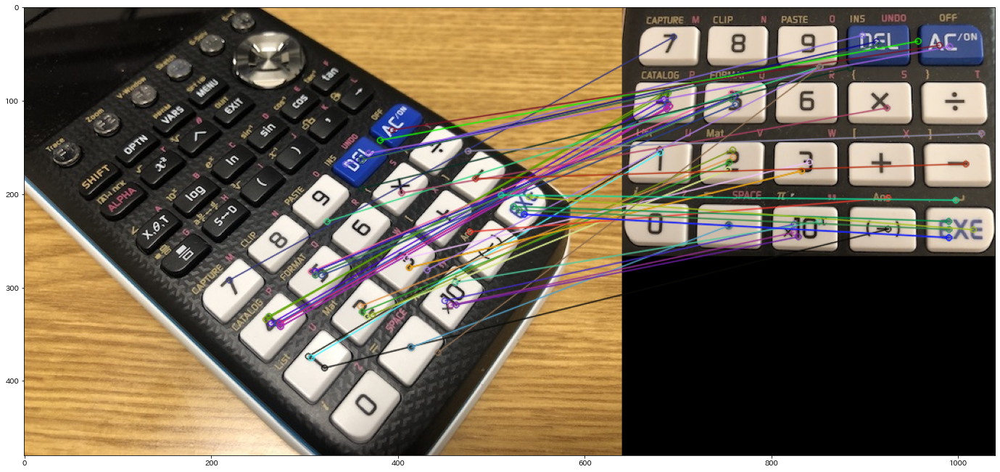

In [22]:
cimg = cv2.imread('Calc2.jpg')
template = cv2.imread('Calc_s.jpg')
gimg = cv2.cvtColor(cimg, cv2.COLOR_BGR2GRAY)
gtemplate = cv2.cvtColor(template, cv2.COLOR_BGR2GRAY)
# detector/descriptorのインスタンス化
fdm = cv2.SIFT_create()
kp = fdm.detect(gimg, None)
# 検出と算出
fp1, fd1 = fdm.detectAndCompute(gimg, None)
fp2, fd2 = fdm.detectAndCompute(gtemplate, None)
dst = cv2.drawKeypoints(gimg, fp1, gimg.copy(), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
plt.subplot(1,2,1)
plt.imshow(cv2.cvtColor(dst, cv2.COLOR_BGR2RGB))
dst2 = cv2.drawKeypoints(gtemplate, fp2, gtemplate.copy(), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
plt.subplot(1,2,2)
plt.imshow(cv2.cvtColor(dst2, cv2.COLOR_BGR2RGB))

# マッチングの準備
bf = cv2.BFMatcher(cv2.NORM_L2)
matches = bf.knnMatch(fd1, fd2, k=2)
# 特徴空間で距離が近いものを選ぶ
good = []
for m,n in matches:
    if m.distance< 0.50*n.distance:
        good.append([m])
# マッチングの可視化
dst = cv2.drawMatchesKnn(cimg, fp1, template, fp2, good, None, flags=2)
plt.figure()
plt.imshow(cv2.cvtColor(dst, cv2.COLOR_BGR2RGB))

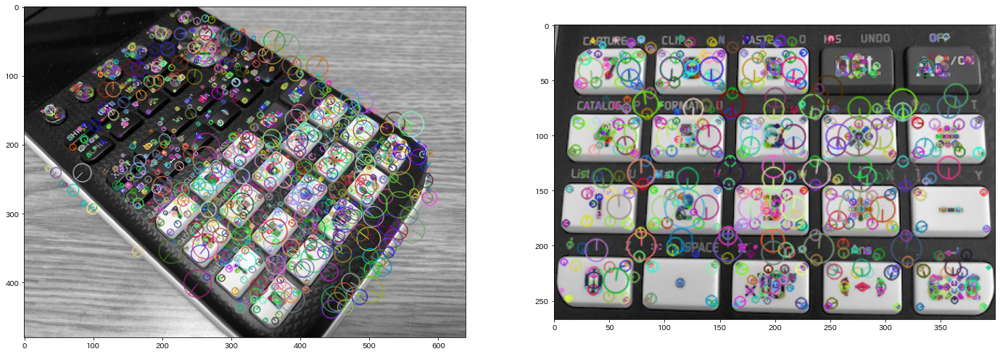

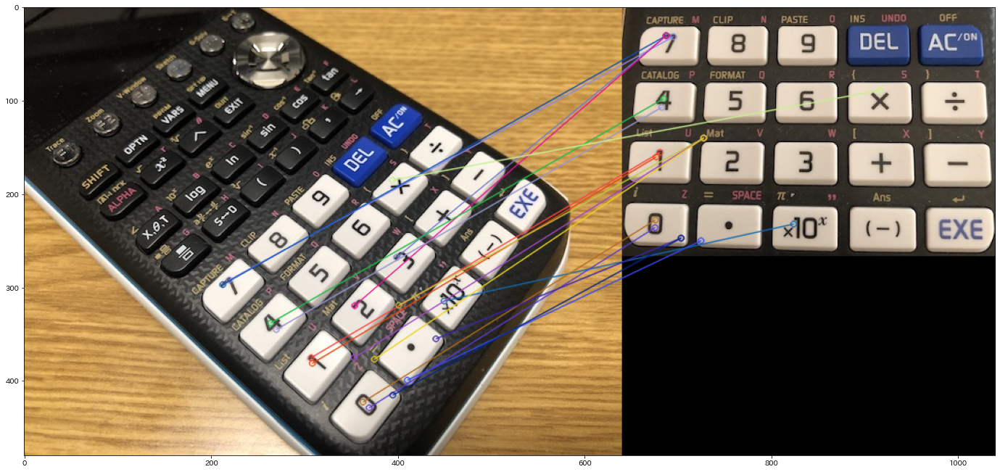

In [24]:
cimg = cv2.imread('Calc2.jpg')
template = cv2.imread('Calc_s.jpg')
gimg = cv2.cvtColor(cimg, cv2.COLOR_BGR2GRAY)
gtemplate = cv2.cvtColor(template, cv2.COLOR_BGR2GRAY)
# detector/descriptorのインスタンス化
fdm = cv2.KAZE_create()
# 検出と算出
fp1, fd1 = fdm.detectAndCompute(gimg, None)
fp2, fd2 = fdm.detectAndCompute(gtemplate, None)
dst = cv2.drawKeypoints(gimg, fp1, gimg.copy(), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
plt.subplot(1,2,1)
plt.imshow(cv2.cvtColor(dst, cv2.COLOR_BGR2RGB))
dst2 = cv2.drawKeypoints(gtemplate, fp2, gtemplate.copy(), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
plt.subplot(1,2,2)
plt.imshow(cv2.cvtColor(dst2, cv2.COLOR_BGR2RGB))

# マッチングの準備
bf = cv2.BFMatcher(cv2.NORM_L2)
matches = bf.knnMatch(fd1, fd2, k=2)
# 特徴空間で距離が近いものを選ぶ
good = []
for m,n in matches:
    if m.distance< 0.50*n.distance:
        good.append([m])
# マッチングの可視化
dst = cv2.drawMatchesKnn(cimg, fp1, template, fp2, good, None, flags=2)
plt.figure()
plt.imshow(cv2.cvtColor(dst, cv2.COLOR_BGR2RGB))

# ORB, BRISK


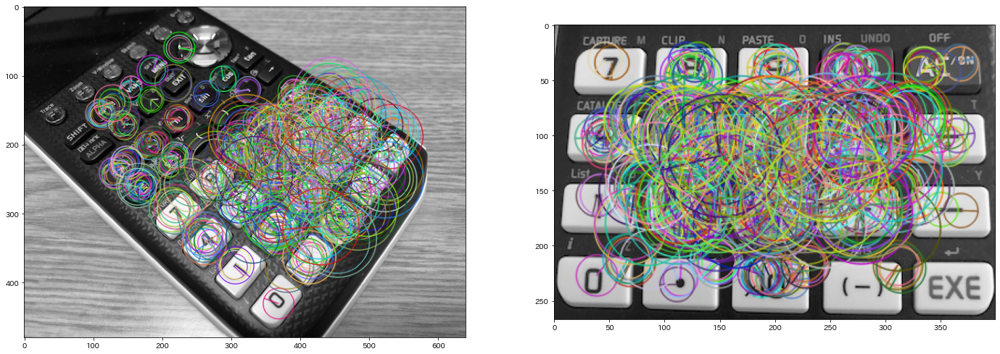

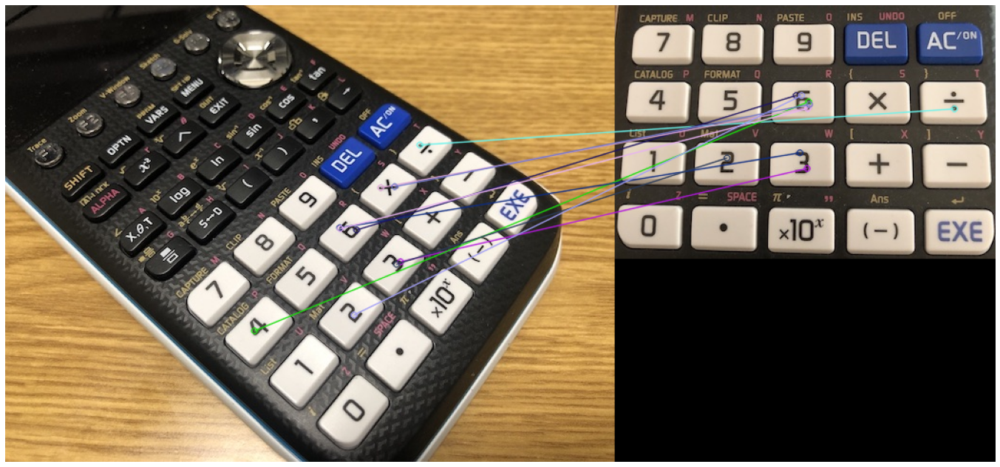

In [12]:
cimg = cv2.imread('Calc2.jpg')
template = cv2.imread('Calc_s.jpg')
gimg = cv2.cvtColor(cimg, cv2.COLOR_BGR2GRAY)
gtemplate = cv2.cvtColor(template, cv2.COLOR_BGR2GRAY)
# detector/descriptorのインスタンス化
fdm = cv2.ORB_create()
# 検出と算出
fp1, fd1 = fdm.detectAndCompute(gimg, None)
fp2, fd2 = fdm.detectAndCompute(gtemplate, None)
dst = cv2.drawKeypoints(gimg, fp1, gimg.copy(), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
plt.subplot(1,2,1)
plt.imshow(cv2.cvtColor(dst, cv2.COLOR_BGR2RGB))
dst2 = cv2.drawKeypoints(gtemplate, fp2, gtemplate.copy(), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
plt.subplot(1,2,2)
plt.imshow(cv2.cvtColor(dst2, cv2.COLOR_BGR2RGB))
# マッチングの準備
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
matches = bf.match(fd1, fd2)
# 特徴空間で距離が近い順にソート
matches = sorted(matches, key=lambda x:x.distance)
# マッチングの可視化
dst = cv2.drawMatches(cimg, fp1, template, fp2, matches[:10], None, flags=2)
plt.figure()
plt.imshow(cv2.cvtColor(dst, cv2.COLOR_BGR2RGB))
plt.axis(False);

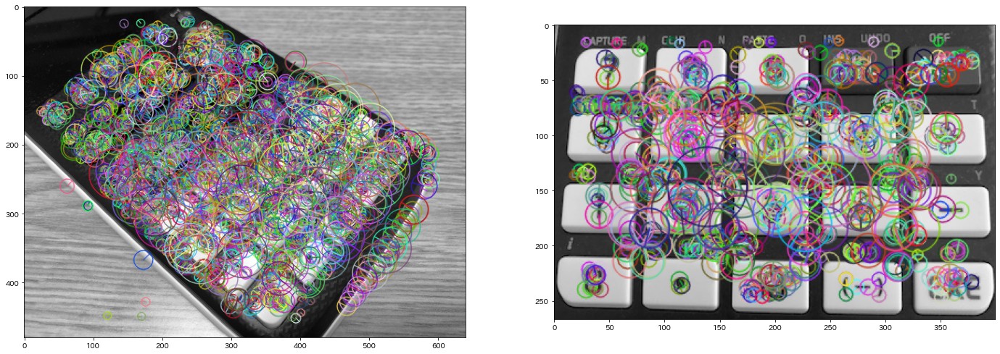

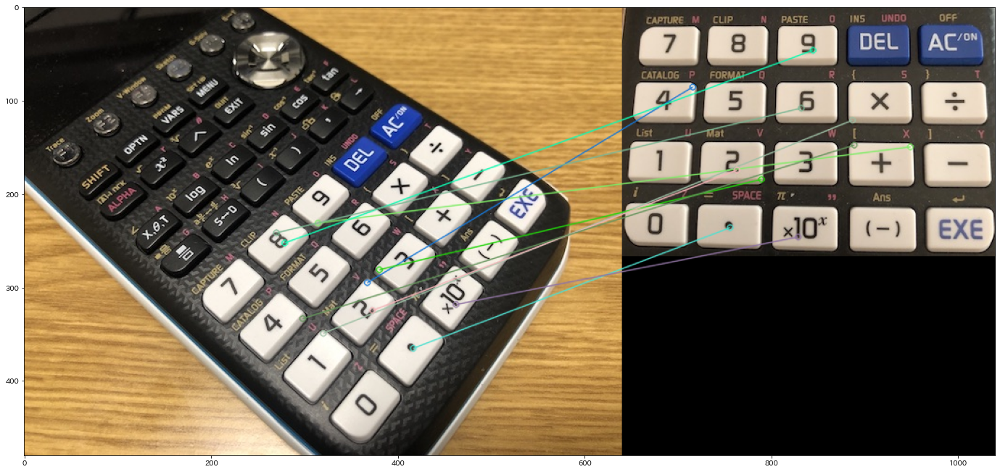

In [13]:
cimg = cv2.imread('Calc2.jpg')
template = cv2.imread('Calc_s.jpg')
gimg = cv2.cvtColor(cimg, cv2.COLOR_BGR2GRAY)
gtemplate = cv2.cvtColor(template, cv2.COLOR_BGR2GRAY)
# detector/descriptorのインスタンス化
fdm = cv2.BRISK_create()
# 検出と算出
fp1, fd1 = fdm.detectAndCompute(gimg, None)
fp2, fd2 = fdm.detectAndCompute(gtemplate, None)
dst = cv2.drawKeypoints(gimg, fp1, gimg.copy(), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
plt.subplot(1,2,1)
plt.imshow(cv2.cvtColor(dst, cv2.COLOR_BGR2RGB))
dst2 = cv2.drawKeypoints(gtemplate, fp2, gtemplate.copy(), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
plt.subplot(1,2,2)
plt.imshow(cv2.cvtColor(dst2, cv2.COLOR_BGR2RGB))
# マッチングの準備
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
matches = bf.match(fd1, fd2)
# 特徴空間で距離が近い順にソート
matches = sorted(matches, key=lambda x:x.distance)
# マッチングの可視化
dst = cv2.drawMatches(cimg, fp1, template, fp2, matches[:10], None, flags=2)
plt.figure()
plt.imshow(cv2.cvtColor(dst, cv2.COLOR_BGR2RGB))


# Hough 変換
standardなHough変換で線検出を行う場合はHoughLinesを使う。投票空間への閾値が設定可能。ここでは150。 linesの出力はrho, thetaなのであとで画像空間での2点(Lineの終端点)に戻す必要がある。

linesがNoneではない前提。 OpenCVのサンプルだとa, bに1000を乗算してるが(この例でも1000)，要は線が画像をはみ出すような座標を取っているだけなので，それぞれ画像高さと幅を乗算するだけでも良いが，4Kのような場合はそれなりの大きさにする必要があるので，とりあえずデカい数字にしておけば問題無い。


(-1000, 207) (999, 208)
(-1000, 318) (999, 319)
(-1000, 161) (999, 162)
(368, 1013) (438, -985)
(-1009, 520) (990, 555)
(365, 1013) (435, -985)
(589, 1000) (589, -1000)
(-1000, 53) (999, 54)
(-1008, 463) (991, 498)
(-1000, 370) (999, 371)
(747, -1026) (817, 972)
(-1022, 614) (976, 684)
(-1008, 461) (991, 496)
(-1000, 550) (999, 551)
(143, 1012) (283, -982)
(-1011, 641) (988, 676)
(-1000, 163) (999, 164)
(-1011, 638) (988, 673)
(160, 1009) (265, -987)
(620, 1000) (620, -1000)


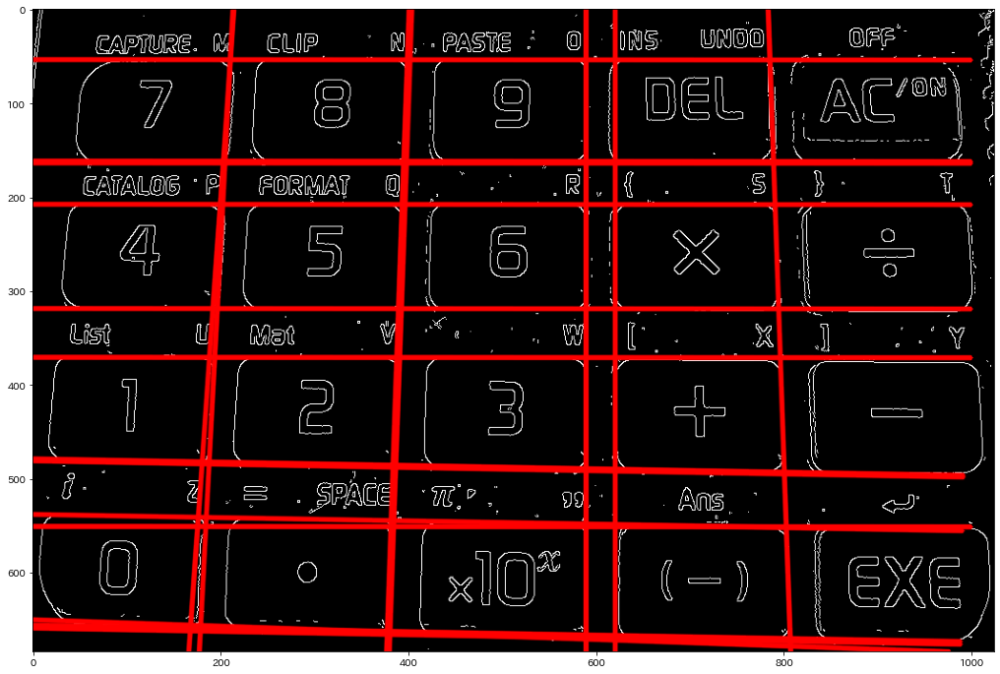

In [14]:
gimg = cv2.imread('Calc.jpg', cv2.IMREAD_GRAYSCALE)
edge = cv2.Canny(gimg, 100, 120, apertureSize=3, )
plt.imshow(edge, cmap='gray')
lines = cv2.HoughLines(edge, 1, np.pi/180.0,  150)
dst = cv2.cvtColor(edge, cv2.COLOR_GRAY2BGR)

for l in lines:
    rho = l[0][0]
    theta = l[0][1]
    a = np.cos(theta)
    b = np.sin(theta)
    x0 = a*rho
    y0 = b*rho
    pt1 = (np.int(x0 + 1000 *(- b)),np.int( y0+ 1000 * a))
    pt2 = (np.int(x0 - 1000 * (- b)),np.int( y0 - 1000 *a))
    print(pt1, pt2)
    cv2.line(dst, pt1, pt2, (0, 0, 255), 3, cv2.LINE_AA)
plt.imshow(cv2.cvtColor(dst, cv2.COLOR_BGR2RGB))

Hough変換の確率的線抽出。OpenCVだとHoughLinePを使う。HoughLinesPの返り値は頂点のペアなのでそのまま線を引けば良い。



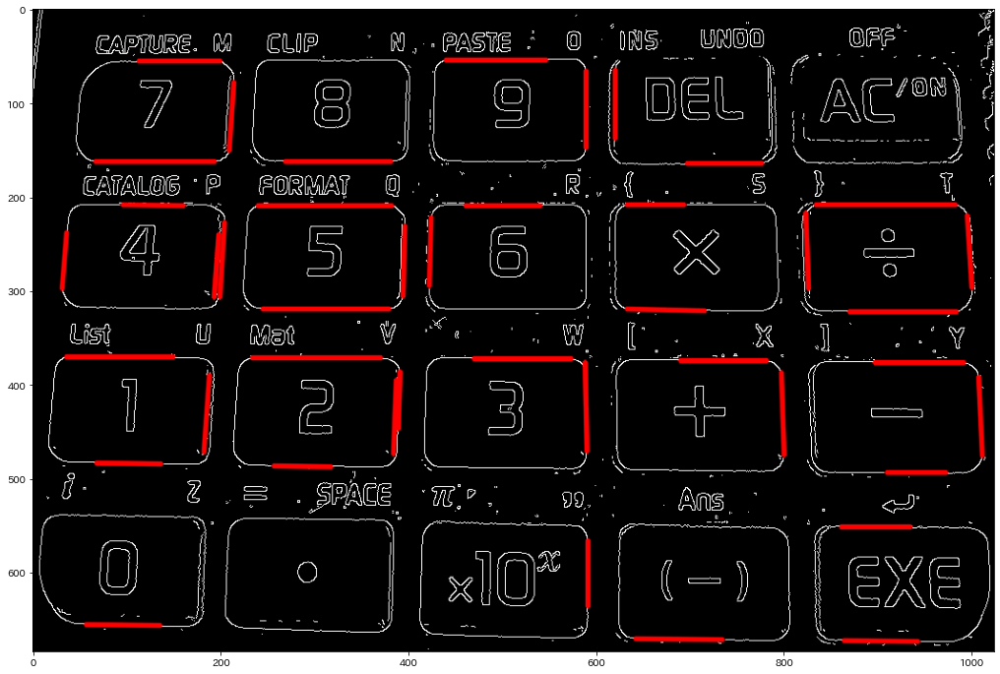

In [15]:

lines = cv2.HoughLinesP(edge, 1, np.pi/180.0, 80, minLineLength=60, maxLineGap=4)
dst = cv2.cvtColor(edge, cv2.COLOR_GRAY2BGR)
for l in lines:
    pt1 = (l[0][0], l[0][1])
    pt2 = (l[0][2], l[0][3])
    cv2.line(dst, pt1, pt2, (0,0,255), 3, cv2.LINE_AA)
plt.imshow(cv2.cvtColor(dst, cv2.COLOR_BGR2RGB))


# Saliency Map
OpenCVでのSpectralResidualと，実装例として[akisatok氏のGithubのコード](https://github.com/akisatok/pySaliencyMap)を拾ってきて動かす例

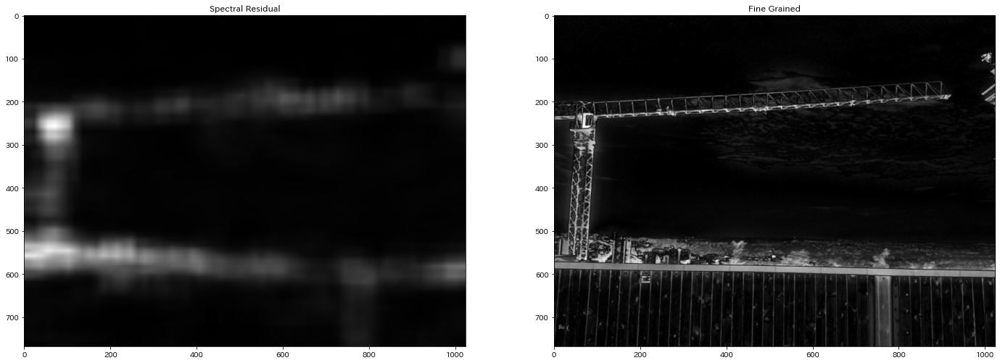

In [16]:
cimg = cv2.imread('crane.jpg')
saliency = cv2.saliency.StaticSaliencySpectralResidual_create()
ret, smap = saliency.computeSaliency(cimg)
plt.subplot(1,2,1)
plt.imshow(smap, cmap='gray')
plt.title('Spectral Residual')
saliency = cv2.saliency.StaticSaliencyFineGrained_create()
ret, smap = saliency.computeSaliency(cimg)
plt.subplot(1,2,2)
plt.imshow(smap, cmap='gray')
plt.title('Fine Grained');


In [17]:
!git clone https://github.com/akisatok/pySaliencyMap.git


Cloning into 'pySaliencyMap'...
remote: Enumerating objects: 54, done.
remote: Total 54 (delta 0), reused 0 (delta 0), pack-reused 54
Unpacking objects: 100% (54/54), done.


/content/pySaliencyMap
/content


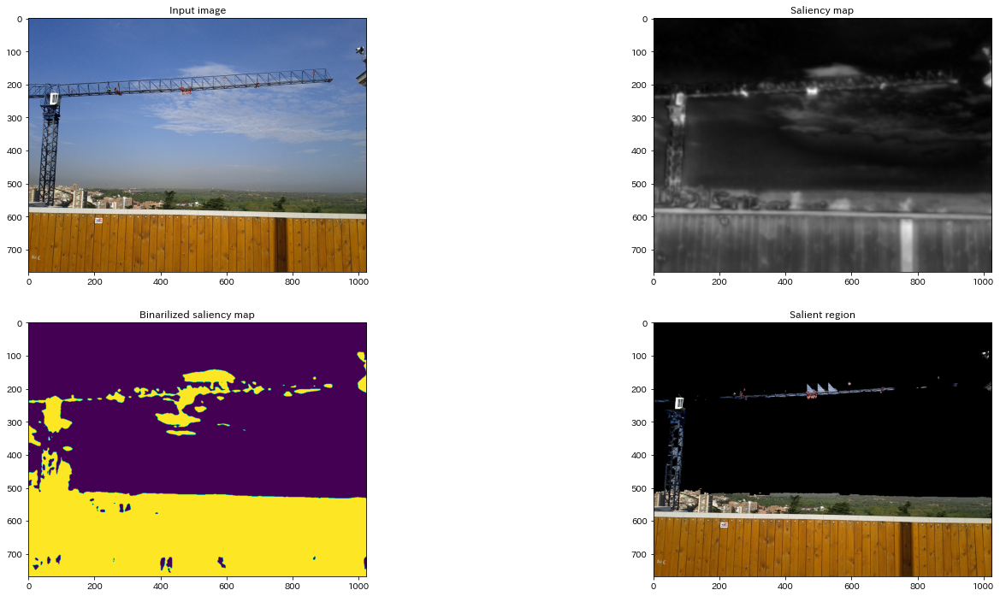

In [18]:
%cd pySaliencyMap/
import pySaliencyMap
cimg = cv2.imread('../crane.jpg')
imgsize = cimg.shape
img_width  = imgsize[1]
img_height = imgsize[0]
sm = pySaliencyMap.pySaliencyMap(img_width, img_height)
saliency_map = sm.SMGetSM(cimg)
binarized_map = sm.SMGetBinarizedSM(cimg)
salient_region = sm.SMGetSalientRegion(cimg)
plt.subplot(2,2,1), plt.imshow(cv2.cvtColor(cimg, cv2.COLOR_BGR2RGB))
plt.title('Input image')
plt.subplot(2,2,2), plt.imshow(saliency_map, 'gray')
plt.title('Saliency map')
plt.subplot(2,2,3), plt.imshow(binarized_map)
plt.title('Binarilized saliency map')
plt.subplot(2,2,4), plt.imshow(cv2.cvtColor(salient_region, cv2.COLOR_BGR2RGB))
plt.title('Salient region')
%cd ..